In [ ]:
import pandas as pd
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import os
import random


In [14]:
df=pd.read_csv('C:/Users/pagmas.saint/Downloads/ai-1810-dpl-302-m-butterfly-image-classification/Training_set.csv')
df.columns
df.head()

,filename,label
0,Image_1.jpg,SOUTHERN DOGFACE
1,Image_2.jpg,ADONIS
2,Image_3.jpg,BROWN SIPROETA
3,Image_4.jpg,MONARCH
4,Image_5.jpg,GREEN CELLED CATTLEHEART


In [4]:
df.shape

(5000, 2)

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5000 entries, 0 to 4999
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  5000 non-null   object
 1   label     5000 non-null   object
dtypes: object(2)
memory usage: 78.3+ KB


Tệp csv có 2 hàng duy nhất là filename và label, trong đó:
- filename hiển thị tên ảnh(số tương ứng ảnh trong tập train)
- label hiển thị tên loài bướm tương ứng với ảnh đó
- Mỗi hàng đều có 5000 giá trị và không có giá trị null. 

In [6]:
label_distribution = df['label'].value_counts()
print("Label Distribution:")
print(label_distribution)

Label Distribution:
label
MOURNING CLOAK     105
SLEEPY ORANGE       82
CRECENT             82
ORANGE TIP          81
ADONIS              78
                  ... 
WOOD SATYR          56
GOLD BANDED         54
MALACHITE           53
ZEBRA LONG WING     52
CRIMSON PATCH       47
Name: count, Length: 75, dtype: int64


Ta có thể nhận thấy có ảnh của tất cả 75 loài bướm, trong đó:
- Số lượng bướm của mỗi loài giao động trong khoảng 47-105 ảnh.
- MOURNING CLOAK là loài bướm có số ảnh nhiều nhất (105 ảnh).
- CRIMSON PATCH có ít ảnh nhất (47 ảnh).

**Visualization**

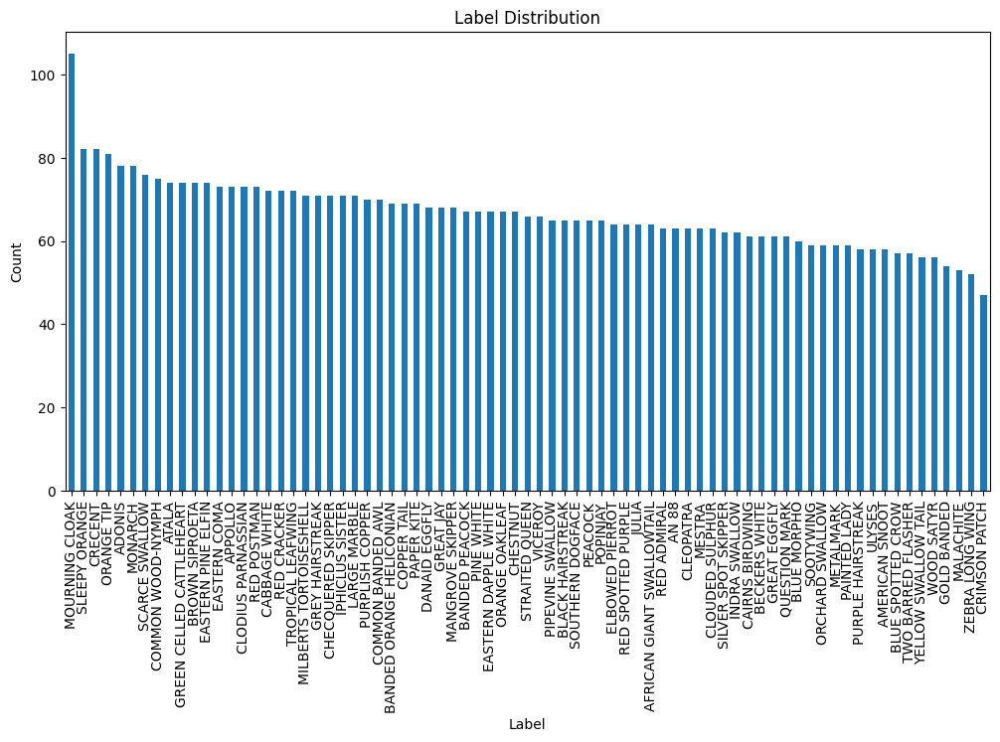

In [7]:
label_distribution.plot(kind='bar', figsize=(12,6))
plt.title('Label Distribution')
plt.xlabel('Label')
plt.ylabel('Count')
plt.show()

Qua biểu đồ cột, ta thấy loài bướm MOURNING CLOAK có số lượng hơn hẳn các loài bướm khác(hơn loài đứng thứ 2 đến 23 ảnh). Trong khi đó các loài bướm khác theo số lượng từ dưới lên có số lượng tăng dần đều. 

In [8]:
df.describe()

,filename,label
count,5000,5000
unique,5000,75
top,Image_5000.jpg,MOURNING CLOAK
freq,1,105


==> Không có bất kì mối liên kết nào giữa các biến trong tập dữ liệu

**Gộp file Training.csv và tập ảnh Training vào làm một**

In [11]:
# Đọc file CSV
dff = pd.read_csv("C:/Users/pagmas.saint/Downloads/ai-1810-dpl-302-m-butterfly-image-classification/Training_set.csv")

# Định dạng lại cột filename nếu cần
dff['filename'] = dff['filename'].astype(str)

# Thư mục chứa ảnh (trong trường hợp chung)
image_dir = "C:/Users/pagmas.saint/Downloads/ai-1810-dpl-302-m-butterfly-image-classification/train/train"
output_dir = "C:/Users/pagmas.saint/Downloads/ai-1810-dpl-302-m-butterfly-image-classification/Train-csv"
os.makedirs(output_dir, exist_ok=True)

# Duyệt qua từng hàng trong CSV
for index, row in dff.iterrows():
    image_path = os.path.join(image_dir, row['filename'])
    
    if os.path.exists(image_path):
        img = cv2.imread(image_path)
        if img is not None:
            # Thêm text lên ảnh
            text = f"Label: {row['label']}, , Class: {row['filename']}"
            cv2.putText(img, text, (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0, 255, 0), 2)
            
            # Lưu ảnh đã chỉnh sửa
            output_path = os.path.join(output_dir, row['filename'])
            cv2.imwrite(output_path, img)

# Xuất bảng dữ liệu có đường dẫn ảnh mới
dff['new_image_path'] = dff['filename'].apply(lambda x: os.path.join(output_dir, x))
dff.to_csv("C:/Users/pagmas.saint/Downloads/ai-1810-dpl-302-m-butterfly-image-classification/Train-csv.csv", index=False)
print("Hoàn thành! Bảng dữ liệu mới đã được tạo.")



Hoàn thành! Bảng dữ liệu mới đã được tạo.


**Hiển thị 25 ảnh ngẫu nhiên của tệp Training**

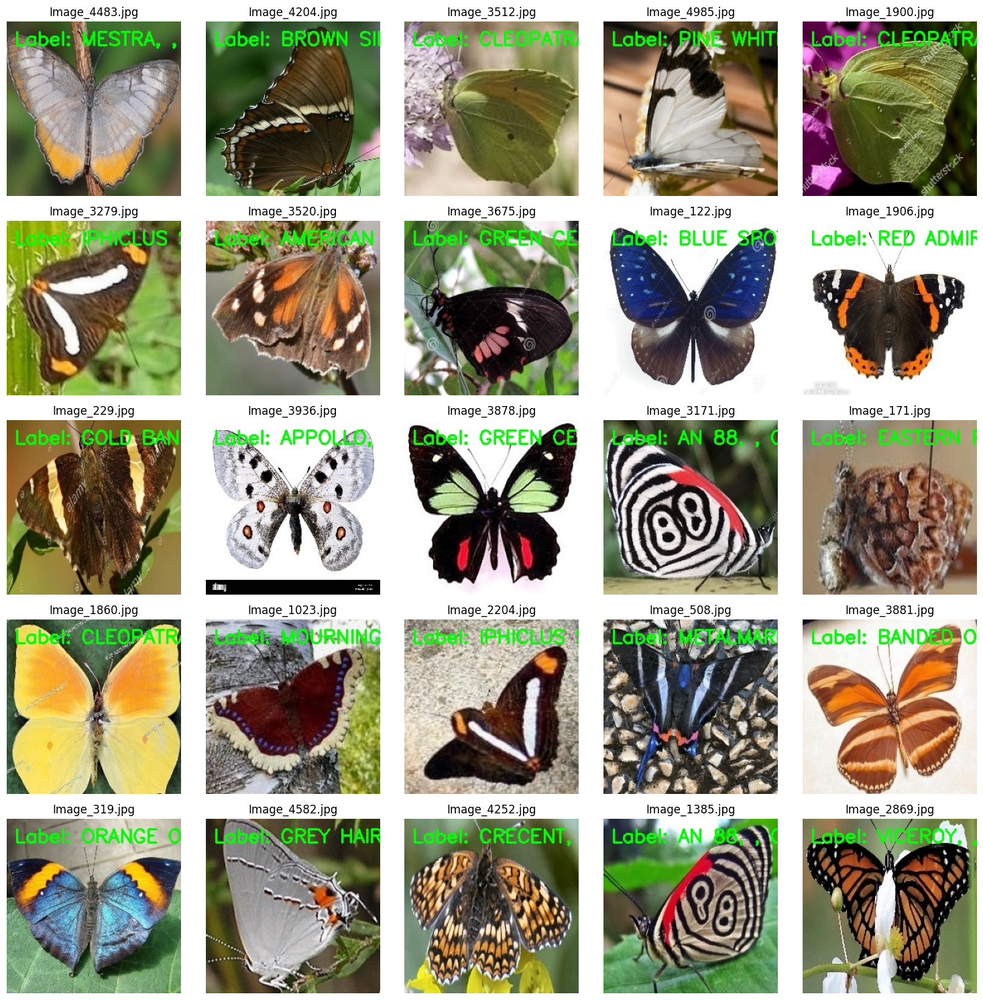

In [ ]:
# Thư mục chứa ảnh
folder_path = "C:/Users/pagmas.saint/Downloads/ai-1810-dpl-302-m-butterfly-image-classification/Train-csv"

# Số lượng ảnh muốn hiển thị
num_images_to_print = 25

# Lấy danh sách các tệp ảnh trong thư mục
image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]

# Chọn ngẫu nhiên num_images_to_print ảnh từ danh sách
random_images = random.sample(image_files, num_images_to_print)

# Tạo figure để hiển thị ảnh
fig, axes = plt.subplots(5, 5, figsize=(15, 15))  # 5x5 grid
axes = axes.flatten()

for ax, image_file in zip(axes, random_images):
    # Đường dẫn đầy đủ đến ảnh
    image_path = os.path.join(folder_path, image_file)
    
    # Đọc ảnh sử dụng OpenCV
    image = cv2.imread(image_path)
    
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Hiển thị ảnh trên subplot
    ax.imshow(image_rgb)
    ax.set_title(image_file)
    ax.axis('off')

# Hiển thị tất cả các ảnh
plt.tight_layout()
plt.show()

**Hiển thị hình ảnh của cùng 2 loài bướm**

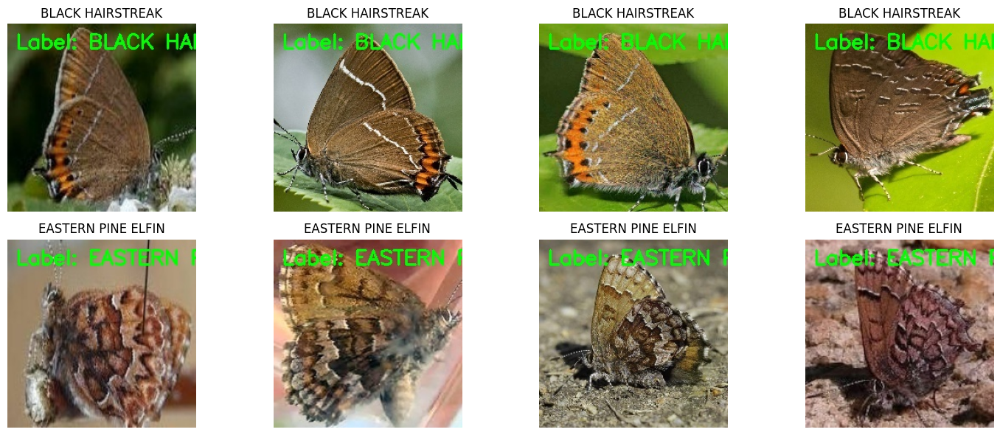

In [26]:
# Chọn ngẫu nhiên 2 nhãn
random_labels = df['label'].unique()
selected_labels = random.sample(list(random_labels), 2)

# Lọc danh sách ảnh thuộc các nhãn đó
filtered_df = df[df['label'].isin(selected_labels)]

# Định nghĩa thư mục chứa ảnh
image_dir = "C:/Users/pagmas.saint/Downloads/ai-1810-dpl-302-m-butterfly-image-classification/Train-csv"

# Giới hạn số ảnh hiển thị (3 ảnh mỗi loài)
n_samples_per_label = 4
selected_images = filtered_df.groupby('label').head(n_samples_per_label)

# Hiển thị ảnh
fig, axes = plt.subplots(2, n_samples_per_label, figsize=(15, 6))
for (label, group), row_axes in zip(selected_images.groupby('label'), axes):
    for ax, img_name in zip(row_axes, group['filename']):
        img_path = os.path.join(image_dir, img_name)
        img = cv2.imread(img_path)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        ax.imshow(img)
        ax.set_title(label)
        ax.axis("off")

plt.tight_layout()
plt.show()

Ta có thể thấy hình ảnh các loài bướm là khá rõ ràng, đa dạng góc cạnh 

**Hiển thị 25 ảnh ngẫu nhiên của tệp Test**


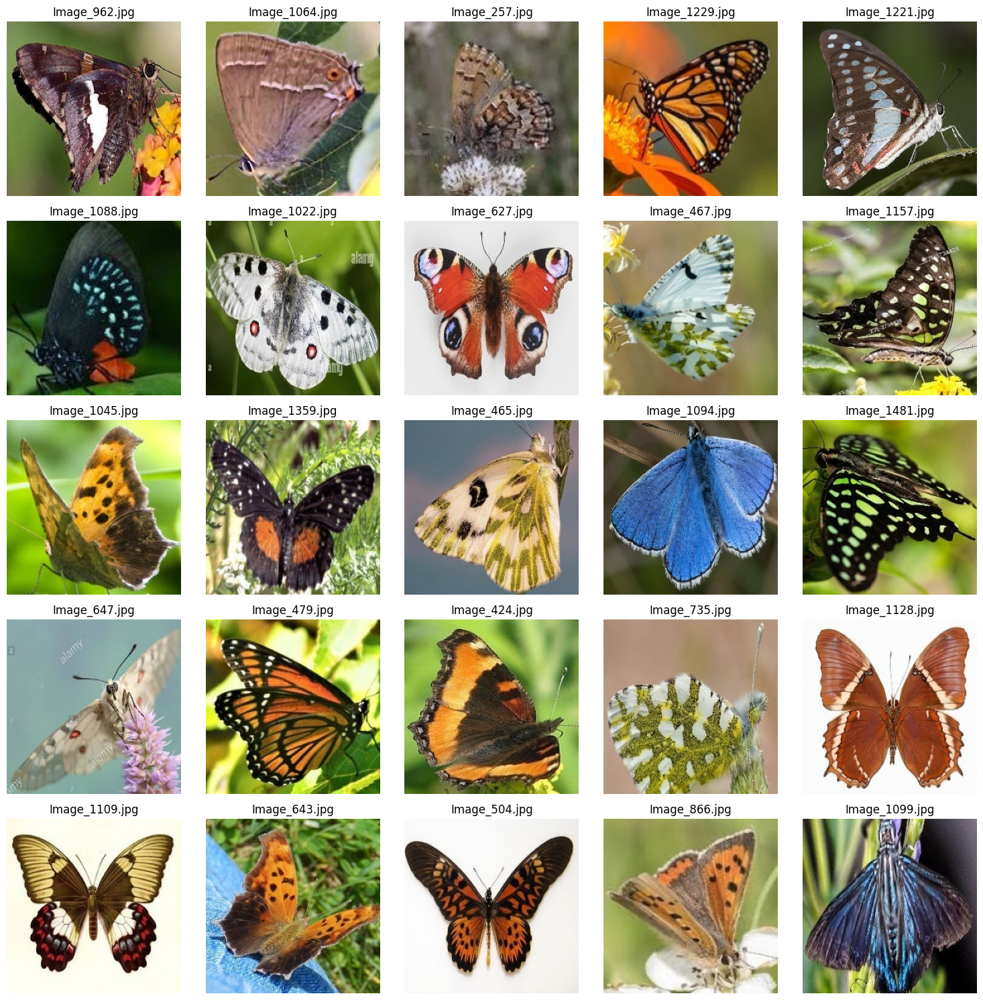

In [10]:
# Thư mục chứa ảnh
folder_path = "C:/Users/pagmas.saint/Downloads/ai-1810-dpl-302-m-butterfly-image-classification/test/test"

# Số lượng ảnh muốn hiển thị
num_images_to_print = 25
# Lấy danh sách các tệp ảnh trong thư mục
image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]

# Chọn ngẫu nhiên num_images_to_print ảnh từ danh sách
random_images = random.sample(image_files, num_images_to_print)

# Tạo figure để hiển thị ảnh
fig, axes = plt.subplots(5, 5, figsize=(15, 15))  # 5x5 grid
axes = axes.flatten()

for ax, image_file in zip(axes, random_images):
    # Đường dẫn đầy đủ đến ảnh
    image_path = os.path.join(folder_path, image_file)
    
    # Đọc ảnh sử dụng OpenCV
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    
    # Hiển thị ảnh trên subplot
    ax.imshow(image_rgb)
    ax.set_title(image_file)
    ax.axis('off')

# Hiển thị tất cả các ảnh
plt.tight_layout()
plt.show()